# **Fish Classification (A Large Scale Fish Dataset) with Deep Learning**

# **1 - Importing Required Libraries**

In [34]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import accuracy_score, f1_score, recall_score, precision_score, confusion_matrix, classification_report
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array
from tensorflow.keras.layers import InputLayer, Dense, Flatten, Dropout, BatchNormalization
import os
import random
from PIL import Image

import warnings
warnings.filterwarnings("ignore")

# **2 - Loading the Data**

In [2]:
import kagglehub

try:
  print("Downloading data...")
  crowww_a_large_scale_fish_dataset_path = kagglehub.dataset_download('crowww/a-large-scale-fish-dataset')
  print('Data source import complete.')
except Exception as e:
  print(e)
  print("Data could not be downloaded.")


100%|██████████| 3.24G/3.24G [00:50<00:00, 69.6MB/s]

Extracting files...


Data source import complete.


In [3]:
directory = crowww_a_large_scale_fish_dataset_path + "/Fish_Dataset/Fish_Dataset"

# **3 - Exploratory Data Analysis**

# 3.1 - Label and Class Analysis

In [4]:
classes = [clss for clss in os.listdir(directory) if "." not in clss]
classes

['Red Sea Bream',
 'Shrimp',
 'Red Mullet',
 'Hourse Mackerel',
 'Striped Red Mullet',
 'Gilt-Head Bream',
 'Black Sea Sprat',
 'Trout',
 'Sea Bass']

In [5]:
img_labels = []
path = []

for dir_name, _, filenames in os.walk(directory):
  for filename in filenames:
    if dir_name.split()[-1] != 'GT':
      if os.path.splitext(filename)[-1] == '.png':
        img_labels.append(os.path.split(dir_name)[-1])
        path.append(os.path.join(dir_name, filename))

data = pd.DataFrame(columns=["path", "label"])
data["path"] = path
data["label"] = img_labels

data

,path,label
0,/root/.cache/kagglehub/datasets/crowww/a-large...,Red Sea Bream
1,/root/.cache/kagglehub/datasets/crowww/a-large...,Red Sea Bream
2,/root/.cache/kagglehub/datasets/crowww/a-large...,Red Sea Bream
3,/root/.cache/kagglehub/datasets/crowww/a-large...,Red Sea Bream
4,/root/.cache/kagglehub/datasets/crowww/a-large...,Red Sea Bream
...,...,...
8995,/root/.cache/kagglehub/datasets/crowww/a-large...,Sea Bass
8996,/root/.cache/kagglehub/datasets/crowww/a-large...,Sea Bass
8997,/root/.cache/kagglehub/datasets/crowww/a-large...,Sea Bass
8998,/root/.cache/kagglehub/datasets/crowww/a-large...,Sea Bass


In [ ]:
print(data.path[0])
print("\n", data.label[0])

/kagglehub/datasets/crowww/a-large-scale-fish-dataset/versions/2/Fish_Dataset/Fish_Dataset/Striped Red Mullet/Striped Red Mullet/00724.png

 Striped Red Mullet


In [ ]:
data.label.value_counts()

,count
label,
Striped Red Mullet,1000
Hourse Mackerel,1000
Red Sea Bream,1000
Sea Bass,1000
Trout,1000
Black Sea Sprat,1000
Gilt-Head Bream,1000
Red Mullet,1000
Shrimp,1000


In [6]:
for unique_label in data["label"].unique():
  print(data[data["label"] == unique_label].iloc[0, 0])

/root/.cache/kagglehub/datasets/crowww/a-large-scale-fish-dataset/versions/2/Fish_Dataset/Fish_Dataset/Red Sea Bream/Red Sea Bream/00022.png
/root/.cache/kagglehub/datasets/crowww/a-large-scale-fish-dataset/versions/2/Fish_Dataset/Fish_Dataset/Black Sea Sprat/Black Sea Sprat/00022.png
/root/.cache/kagglehub/datasets/crowww/a-large-scale-fish-dataset/versions/2/Fish_Dataset/Fish_Dataset/Hourse Mackerel/Hourse Mackerel/00022.png
/root/.cache/kagglehub/datasets/crowww/a-large-scale-fish-dataset/versions/2/Fish_Dataset/Fish_Dataset/Red Mullet/Red Mullet/00022.png
/root/.cache/kagglehub/datasets/crowww/a-large-scale-fish-dataset/versions/2/Fish_Dataset/Fish_Dataset/Sea Bass/Sea Bass/00022.png
/root/.cache/kagglehub/datasets/crowww/a-large-scale-fish-dataset/versions/2/Fish_Dataset/Fish_Dataset/Trout/Trout/00022.png
/root/.cache/kagglehub/datasets/crowww/a-large-scale-fish-dataset/versions/2/Fish_Dataset/Fish_Dataset/Gilt-Head Bream/Gilt-Head Bream/00022.png
/root/.cache/kagglehub/datasets/c

# 3.2 - Data/Image Visualization

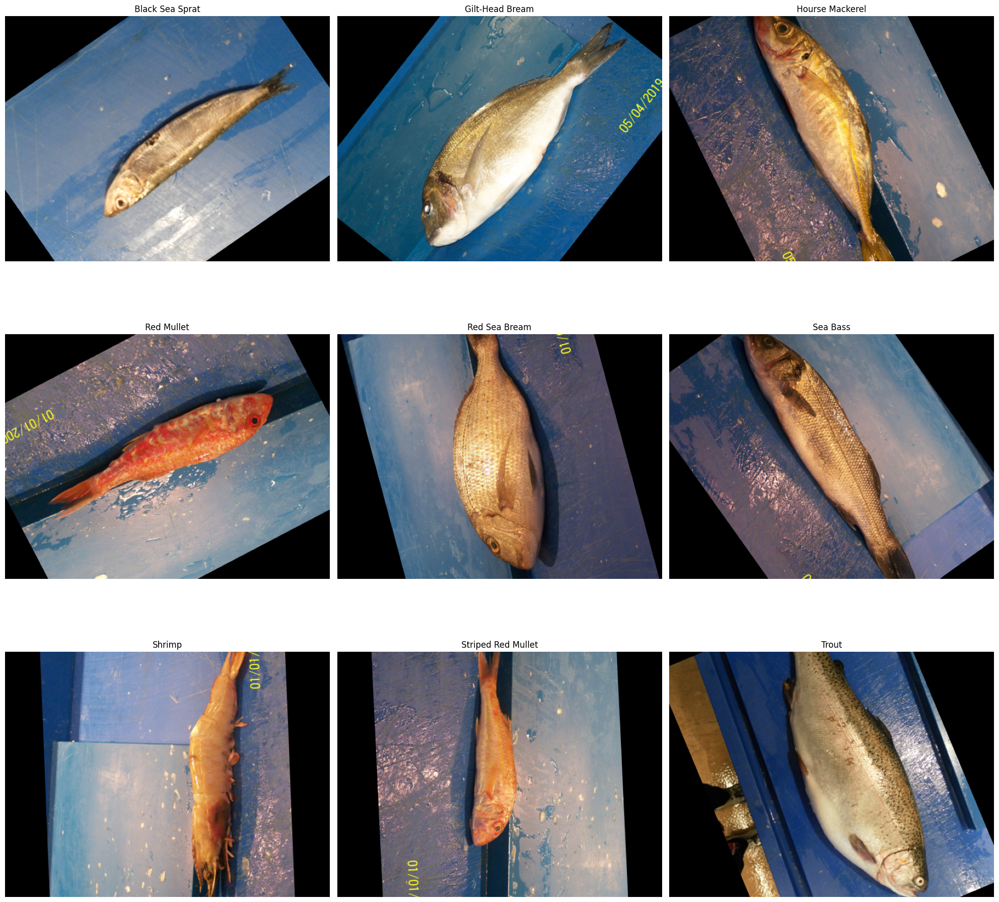

In [ ]:
img_count = 0

plt.figure(figsize=(20, 20))
for unique_label in data["label"].unique():
  plt.subplot(3, 3, img_count + 1)
  unique_img = (data[data["label"] == unique_label].iloc[0, 0])
  full_path = os.path.join(directory[12:], unique_img)
  plt.imshow(plt.imread(full_path))
  plt.title(unique_label)
  plt.axis("off")
  img_count +=1
  if img_count >= 9:
    break

plt.tight_layout()
plt.show()

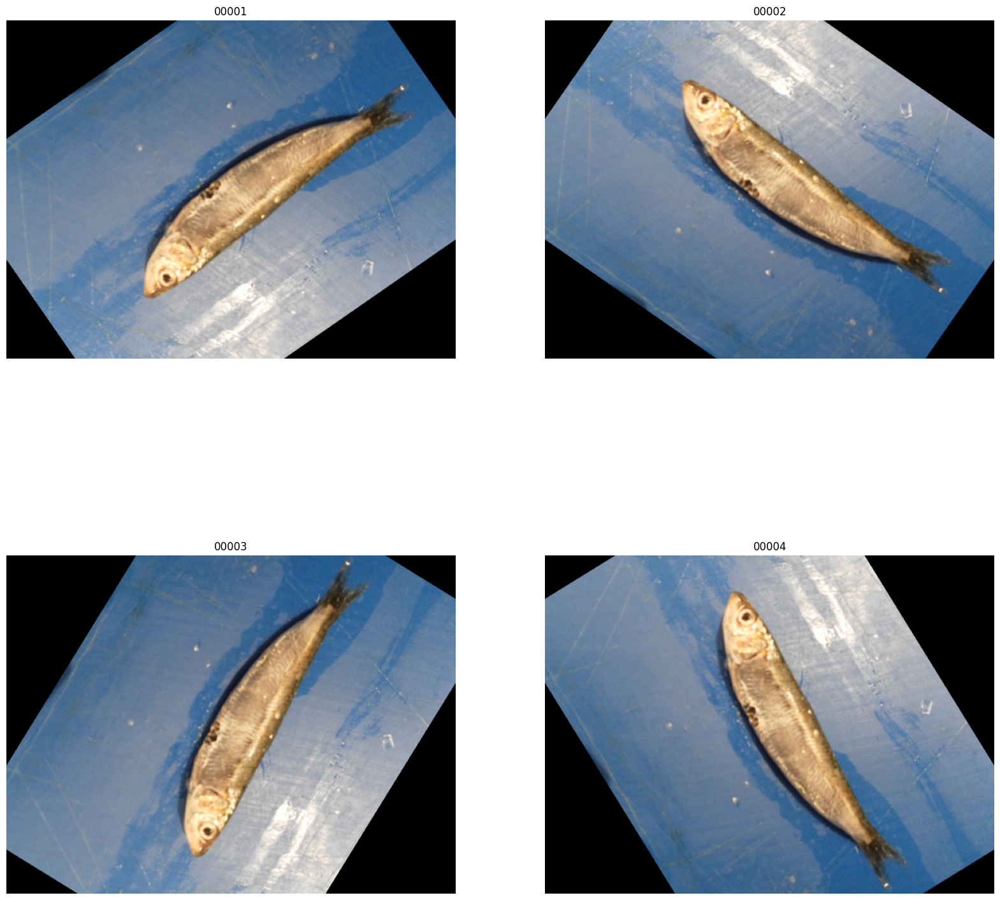

In [ ]:
black_sea_sprats = data[data["label"] == "Black Sea Sprat"].path.iloc[0:4]

img_count = 0
plt.figure(figsize=(20, 20))
for black_sea_sprat in black_sea_sprats:
  plt.subplot(int(np.sqrt(len(black_sea_sprats))), int(np.sqrt(len(black_sea_sprats))), img_count + 1)
  plt.imshow(plt.imread(black_sea_sprat))
  plt.title(black_sea_sprat[-9:-4])
  plt.axis("off")
  img_count += 1

plt.show()


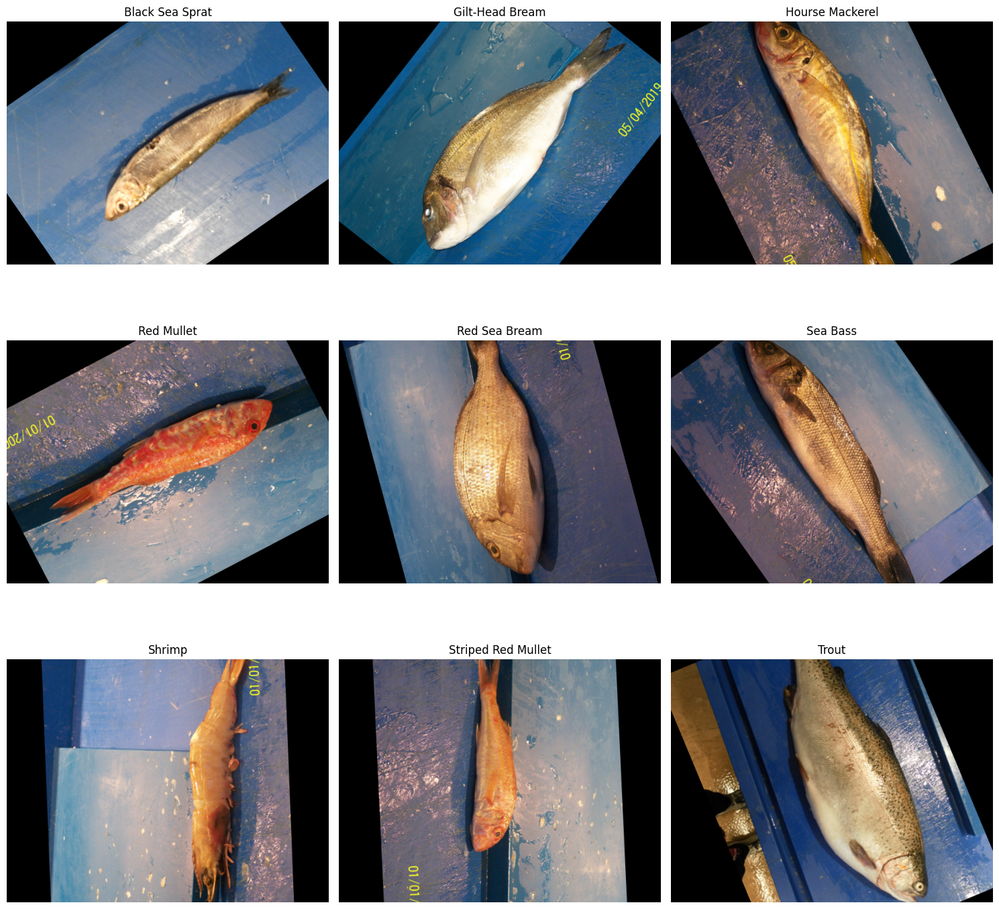

In [ ]:
def show_images(images, labels, num_rows=3, num_cols=3):
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 15))
    for i, ax in enumerate(axes.flat):
        if i < len(images):
            ax.imshow(plt.imread(images[i]))
            ax.set_title(labels[i])
            ax.axis('off')
    plt.tight_layout()
    plt.show()

sample_images = []
sample_labels = []

for label in data['label'].unique():
    sample = data[data['label'] == label].iloc[0]
    full_path = os.path.join(directory, sample['path'])
    sample_images.append(full_path)
    sample_labels.append(label)

show_images(sample_images, sample_labels)

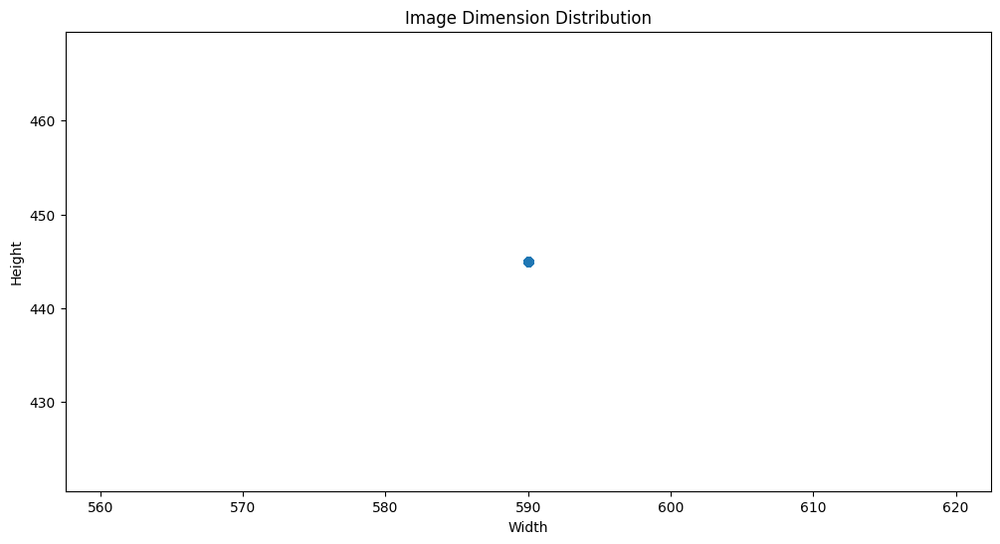

In [ ]:
widths = []
heights = []

for img_path in data['path']:
    full_path = os.path.join(directory, img_path)
    with Image.open(full_path) as img:
        width, height = img.size
        widths.append(width)
        heights.append(height)

plt.figure(figsize=(12, 6))
plt.scatter(widths, heights, alpha=0.5)
plt.xlabel('Width')
plt.ylabel('Height')
plt.title('Image Dimension Distribution')
plt.show()

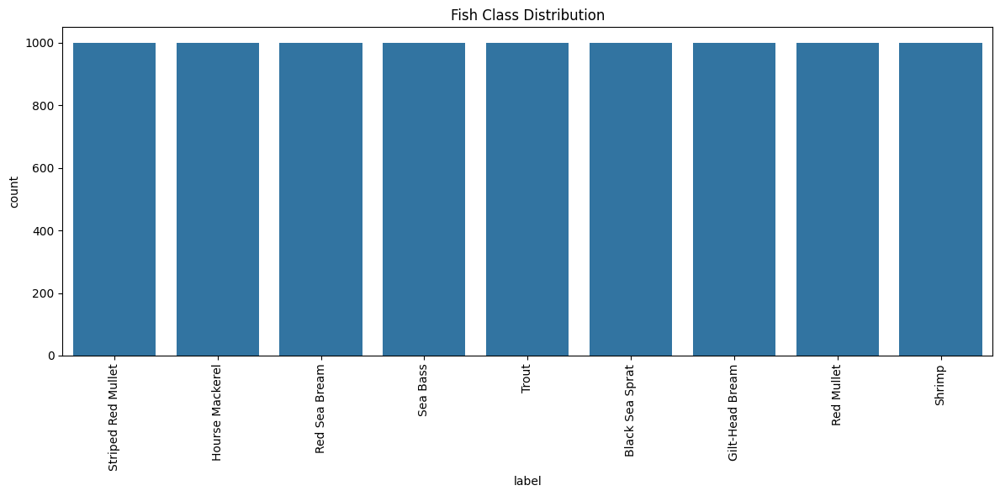

In [ ]:
plt.figure(figsize=(12, 6))
sns.countplot(data=data, x="label")
plt.title("Fish Class Distribution")
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

# **4 - Data Preprocessing**

# 4.1 - Data Preparation

# 4.1.1 - Train, Test, Validation Split:
Train, Test, Validation Split: We split the dataset into training, test, and validation sets at a ratio of 70%, 15%, and 15% respectively, using the train_test_split() function.

In [6]:
# Train, Test, Validation Data Splitting
X_train, X_test_val, y_train, y_test_val = train_test_split(data['path'], data['label'], test_size=0.3, random_state=42)
X_test, X_val, y_test, y_val = train_test_split(X_test_val, y_test_val, test_size=0.5, random_state=42)

In [7]:
print(f"Training Set: {len(X_train)}\nTest Set: {len(X_test)}\nValidation Set: {len(X_val)}")

Training Set: 6300
Test Set: 1350
Validation Set: 1350


# 4.1.2 - Data Normalization:
We apply data normalization to the training data set.

In [8]:
# Data Normalization
train_datagen = ImageDataGenerator(
    rescale=1./255,
)

test_val_datagen = ImageDataGenerator(rescale=1./255)

# 4.1.3 - Create Data Generators:
We create separate ImageDataGenerator objects for the training, test, and validation data. These generators will be used to feed the data to your model.

In [10]:
train_generator = train_datagen.flow_from_dataframe(
    dataframe=data.loc[data['path'].isin(X_train)],
    directory=directory,
    x_col="path",
    y_col="label",
    target_size=(224, 224),
    batch_size=32,
    subset='training',
    class_mode="categorical")

test_generator = test_val_datagen.flow_from_dataframe(
    dataframe=data.loc[data['path'].isin(X_test)],
    directory=directory,
    x_col="path",
    y_col="label",
    target_size=(224, 224),
    batch_size=32,
    class_mode="categorical")

val_generator = test_val_datagen.flow_from_dataframe(
    dataframe=data.loc[data['path'].isin(X_val)],
    directory=directory,
    x_col="path",
    y_col="label",
    target_size=(224, 224),
    batch_size=32,
    class_mode="categorical")

Found 6300 validated image filenames belonging to 9 classes.
Found 1350 validated image filenames belonging to 9 classes.
Found 1350 validated image filenames belonging to 9 classes.


# **5 - Artificial Neural Network (ANN) Model with Hyperparameter Optimization**

# 5.1 - Model Architecture
We begin by creating a simple Artificial Neural Network (ANN) model. The model flattens the input images and passes them through a couple of dense layers, ending with a softmax activation for classification.

In [19]:
# Model Build
model = Sequential([
    InputLayer(input_shape=(224, 224, 3)),
    # Flatten the input (converting 2D image into 1D)
    Flatten(),
    Dense(512, activation='relu'),
    BatchNormalization(),
    Dropout(0.2),
    # Hidden Layers
    Dense(512, activation='relu'),
    BatchNormalization(),
    Dropout(0.2),
    Dense(256, activation='relu'),
    BatchNormalization(),
    Dropout(0.2),
    Dense(128, activation='relu'),
    BatchNormalization(),
    Dropout(0.2),
    Dense(64, activation='relu'),
    Dropout(0.2),
    # Output Layer (number of classes corresponds to the fish species in the dataset)
    Dense(len(classes), activation='softmax')
])

In [20]:
# Compiling the model
model.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])

In [21]:
# Summarizing the model
model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ flatten_1 (Flatten)                  │ (None, 150528)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5 (Dense)                      │ (None, 512)                 │      77,070,848 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_3                │ (None, 512)                 │           2,048 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_4 (Dropout)                  │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6 (Dense)                      │ (None, 512)                 │         262,656 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_4                │ (None, 512)                 │           2,048 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_5 (Dropout)                  │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7 (Dense)                      │ (None, 256)                 │         131,328 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_5                │ (None, 256)                 │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_6 (Dropout)                  │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_8 (Dense)                      │ (None, 128)                 │          32,896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_6                │ (None, 128)                 │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_7 (Dropout)                  │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_9 (Dense)                      │ (None, 64)                  │           8,256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_8 (Dropout)                  │ (None, 64)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_10 (Dense)                     │ (None, 9)                   │             585 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 77,512,201 (295.69 MB)

 Trainable params: 77,509,385 (295.67 MB)

 Non-trainable params: 2,816 (11.00 KB)

**Flatten Layer:** Converts the 224x224 pixel image into a 1D vector, which is needed to pass the data to the dense layers.

**Batch Normalization Layer**: Normalizes the output of the previous layer by scaling and shifting the inputs, ensuring that they have a consistent distribution. This helps stabilize and accelerate the training process, making the model converge faster and improving performance by reducing internal covariate shift.

**Dense Layers:** The hidden layers with ReLU activation help the model learn complex patterns.

**Dropout:** Used to prevent overfitting by randomly deactivating neurons during training.

**Output Layer:** Softmax activation provides probabilities for each class (fish species).

# 5.2 - Early Stopping and Learning Rate Reduction
To avoid overfitting and optimize the training process, we will use EarlyStopping and ReduceLROnPlateau callbacks.

In [22]:
# Callbacks
early_stop = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=3, min_lr=0.001)

**EarlyStopping:** Stops training if the validation loss does not improve after a certain number of epochs (patience=5).

**ReduceLROnPlateau:** If validation loss plateaus, it reduces the learning rate by a factor of 0.2, allowing the model to fine-tune.

# 5.3 - Model Training
Next, we train the model using the fit function, monitoring both the training and validation datasets.

In [23]:
# Model Training

history = model.fit(
    train_generator,
    validation_data=val_generator,
    epochs=30,
    batch_size=64,
    callbacks=[early_stop, reduce_lr]
)

Epoch 1/30
197/197 ━━━━━━━━━━━━━━━━━━━━ 210s 1s/step - accuracy: 0.2568 - loss: 2.1772 - val_accuracy: 0.3474 - val_loss: 1.9328 - learning_rate: 0.0010
Epoch 2/30
197/197 ━━━━━━━━━━━━━━━━━━━━ 196s 984ms/step - accuracy: 0.4648 - loss: 1.4658 - val_accuracy: 0.6481 - val_loss: 1.0073 - learning_rate: 0.0010
Epoch 3/30
197/197 ━━━━━━━━━━━━━━━━━━━━ 195s 981ms/step - accuracy: 0.6106 - loss: 1.0949 - val_accuracy: 0.6148 - val_loss: 1.0920 - learning_rate: 0.0010
Epoch 4/30
197/197 ━━━━━━━━━━━━━━━━━━━━ 214s 1s/step - accuracy: 0.7098 - loss: 0.8413 - val_accuracy: 0.6489 - val_loss: 1.1818 - learning_rate: 0.0010
Epoch 5/30
197/197 ━━━━━━━━━━━━━━━━━━━━ 255s 1s/step - accuracy: 0.7539 - loss: 0.7053 - val_accuracy: 0.5881 - val_loss: 1.4375 - learning_rate: 0.0010
Epoch 6/30
197/197 ━━━━━━━━━━━━━━━━━━━━ 211s 1s/step - accuracy: 0.8237 - loss: 0.5335 - val_accuracy: 0.7711 - val_loss: 0.6963 - learning_rate: 0.0010
Epoch 7/30
197/197 ━━━━━━━━━━━━━━━━━━━━ 201s 1s/step - accuracy: 0.8337 - lo

**Training and Validation:** We use train_generator for training and val_generator for validation to monitor performance.

**Epochs:** The model will train for a maximum of 30 epochs but might stop earlier due to early stopping.

# 5.5 - Model Evaluation
Finally, we evaluate the model's performance on the test data and compute metrics like accuracy, F1 score, precision, recall, and generate a confusion matrix.

**5.5.1 - Model Accuracy and Loss Visualization**

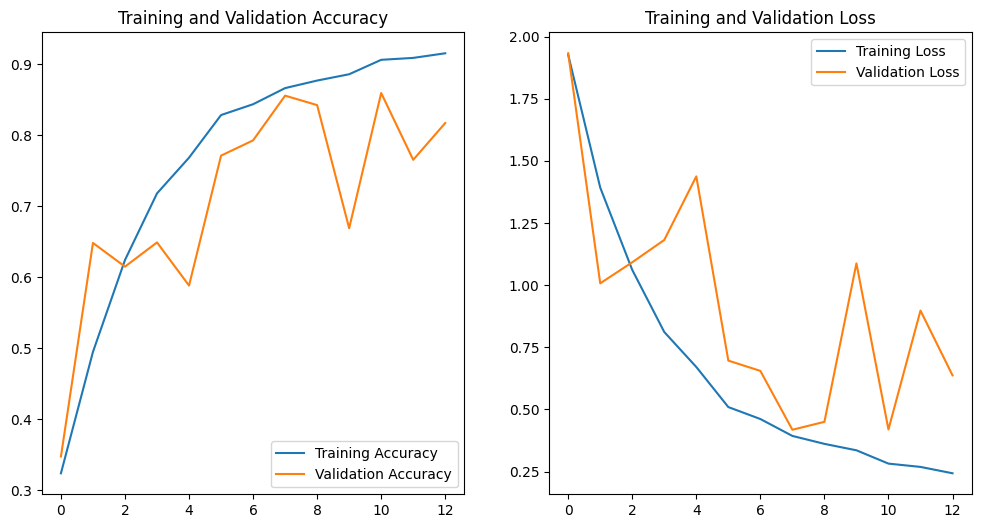

In [28]:
# Plotting accuracy and loss
def plot_accuracy_and_loss(history):
    acc = history.history['accuracy']
    val_acc = history.history['val_accuracy']

    loss = history.history['loss']
    val_loss = history.history['val_loss']

    epochs_range = range(len(acc))

    plt.figure(figsize=(12, 6))

    # Accuracy Plot
    plt.subplot(1, 2, 1)
    plt.plot(epochs_range, acc, label='Training Accuracy')
    plt.plot(epochs_range, val_acc, label='Validation Accuracy')
    plt.legend(loc='lower right')
    plt.title('Training and Validation Accuracy')

    # Loss Plot
    plt.subplot(1, 2, 2)
    plt.plot(epochs_range, loss, label='Training Loss')
    plt.plot(epochs_range, val_loss, label='Validation Loss')
    plt.legend(loc='upper right')
    plt.title('Training and Validation Loss')

    plt.show()

# Call the function
plot_accuracy_and_loss(history)


This code plots both the training and validation accuracy and loss over the epochs. By visualizing this data, you can detect potential overfitting or underfitting:

**- Overfitting:** If the training accuracy is significantly higher than the validation accuracy or if the validation loss increases while the training loss decreases, your model may be overfitting to the training data.

**- Underfitting:** If both the training and validation accuracy are low, your model may not have learned enough during training.

Visualizing these metrics allows you to monitor the model's progress during training and adjust the architecture or training parameters as needed.

**5.5.2 - Confusion Matrix**

43/43 ━━━━━━━━━━━━━━━━━━━━ 12s 269ms/step


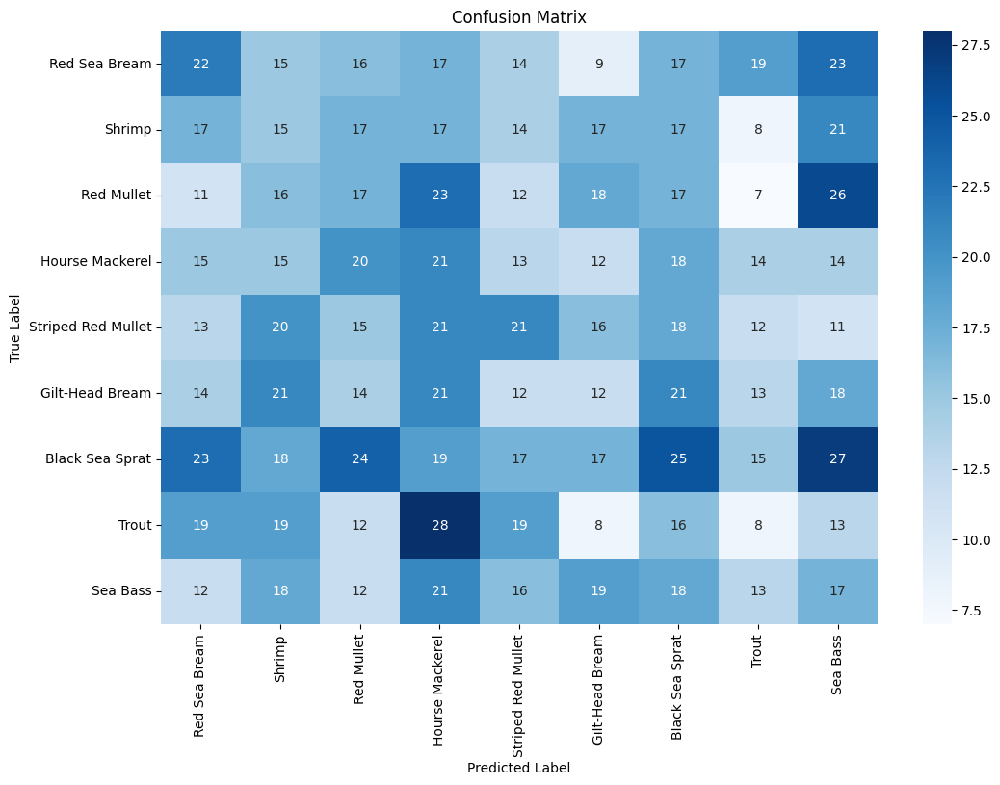

In [29]:
# Confusion Matrix Visualization
def plot_confusion_matrix(y_true, y_pred_classes, classes):
    conf_matrix = confusion_matrix(y_true, y_pred_classes)
    plt.figure(figsize=(12, 8))
    sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=classes, yticklabels=classes)
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.title('Confusion Matrix')
    plt.show()

# Get true and predicted labels
y_pred = model.predict(test_generator)
y_pred_classes = np.argmax(y_pred, axis=1)
y_true = test_generator.classes

# Plot Confusion Matrix
plot_confusion_matrix(y_true, y_pred_classes, classes)


The confusion matrix provides a detailed breakdown of the model's classification performance for each class. It shows how many instances were correctly or incorrectly classified into each category:

**- True Positives (TP):** Correctly predicted instances for a class.

**- False Positives (FP):** Instances incorrectly predicted as a particular class (misclassification).
**- False Negatives (FN):** Instances that belong to a class but were predicted as something else.

This matrix helps to identify specific classes where the model struggles, allowing you to target specific improvements, such as class balancing, better feature extraction, or data augmentation.

**5.5.3 - Classification Report**

In [30]:
# Classification Report
from sklearn.metrics import classification_report

# Generate classification report
report = classification_report(y_true, y_pred_classes, target_names=classes)
print(report)

                    precision    recall  f1-score   support

     Red Sea Bream       0.15      0.14      0.15       152
            Shrimp       0.10      0.10      0.10       143
        Red Mullet       0.12      0.12      0.12       147
   Hourse Mackerel       0.11      0.15      0.13       142
Striped Red Mullet       0.15      0.14      0.15       147
   Gilt-Head Bream       0.09      0.08      0.09       146
   Black Sea Sprat       0.15      0.14      0.14       185
             Trout       0.07      0.06      0.06       142
          Sea Bass       0.10      0.12      0.11       146

          accuracy                           0.12      1350
         macro avg       0.12      0.12      0.12      1350
      weighted avg       0.12      0.12      0.12      1350



The classification report includes key metrics for each class:

**- Precision:** The ratio of correctly predicted positive observations to total predicted positives (TP / (TP + FP)). High precision means few false positives.

**- Recall:** The ratio of correctly predicted positive observations to all actual positives (TP / (TP + FN)). High recall means few false negatives.

**- F1 Score:** The harmonic mean of precision and recall. A balanced measure useful for imbalanced datasets.

This report gives a class-wise performance overview and helps identify classes where precision, recall, or F1 score is low. Improving these scores can involve balancing the data, tuning the model, or altering class-specific hyperparameters.

**5.5.4 - ROC Curve and AUC (Area Under Curve)**

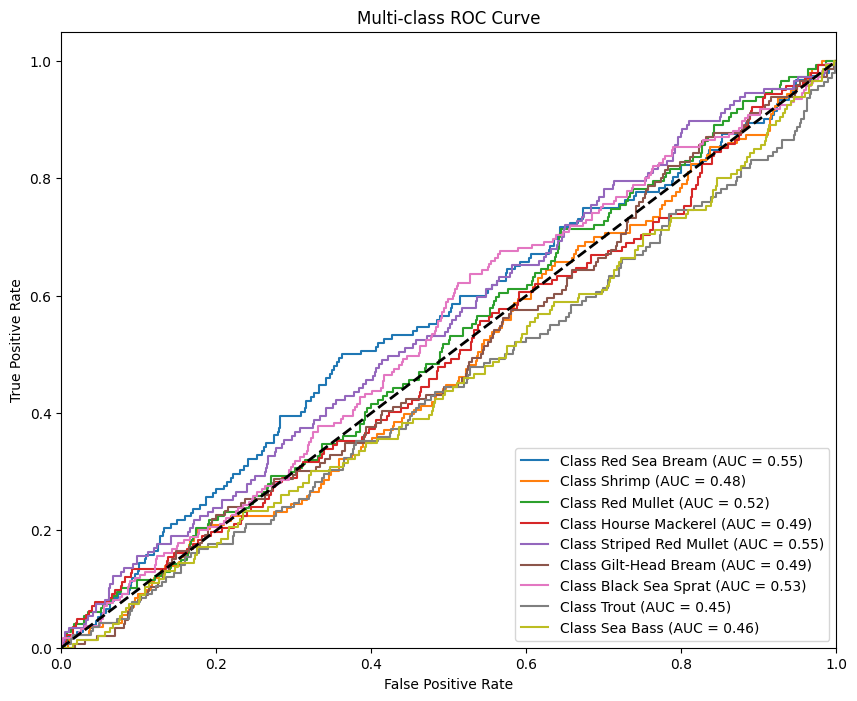

In [31]:
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize

# Binarize the labels for multi-class ROC analysis
y_true_bin = label_binarize(y_true, classes=range(len(classes)))

# Calculate ROC curves and AUC for each class
fpr = dict()
tpr = dict()
roc_auc = dict()

for i in range(len(classes)):
    fpr[i], tpr[i], _ = roc_curve(y_true_bin[:, i], y_pred[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot ROC curves
plt.figure(figsize=(10, 8))
for i in range(len(classes)):
    plt.plot(fpr[i], tpr[i], label=f'Class {classes[i]} (AUC = {roc_auc[i]:.2f})')
plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Multi-class ROC Curve')
plt.legend(loc='lower right')
plt.show()

The ROC curve plots the true positive rate (TPR) against the false positive rate (FPR) for each class, showing the trade-off between sensitivity (recall) and specificity across different thresholds. The **AUC (Area Under Curve)** score summarizes the performance of the classifier:

- AUC close to 1 means the model is very good at distinguishing between classes.

- AUC around 0.5 means the model has no discriminative power.

For multi-class classification, separate ROC curves and AUC values are plotted for each class, giving a detailed look into the model's performance on each individual class.

**5.5.5 - Error Analysis**

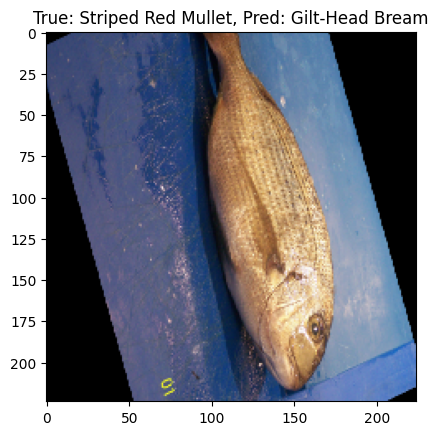

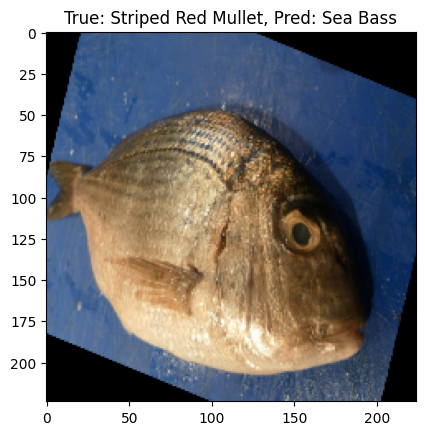

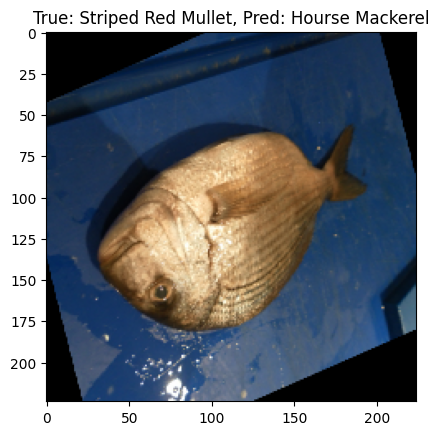

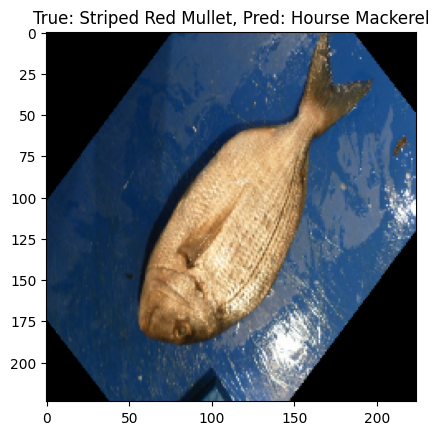

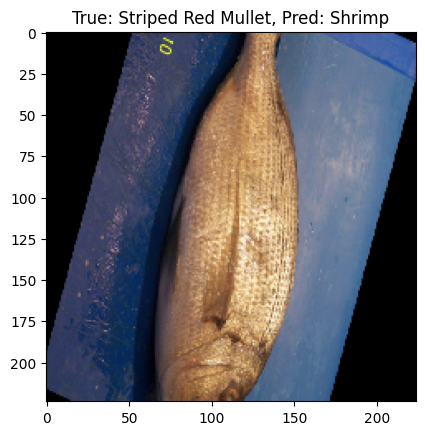

In [32]:
# Incorrect predictions
incorrect = np.where(y_true != y_pred_classes)[0]

# Display some incorrect predictions
for i in range(5):
    img_path = test_generator.filenames[incorrect[i]]
    img = load_img(os.path.join(directory, img_path), target_size=(224, 224))
    img_array = img_to_array(img) / 255.
    plt.imshow(img_array)
    plt.title(f'True: {classes[y_true[incorrect[i]]]}, Pred: {classes[y_pred_classes[incorrect[i]]]}')
    plt.show()

This code identifies the incorrectly classified images and displays them, showing the true and predicted labels. By examining these misclassifications:

- You can understand why the model might be struggling with certain images.
- You can look for patterns in the errors (e.g., confusing similar-looking species in your fish dataset) and use this information to improve your model.

Error analysis helps refine the model further by addressing common mistakes and improving the model’s generalization ability.

# **6 - Model Predicitions and Visualization**

43/43 ━━━━━━━━━━━━━━━━━━━━ 12s 271ms/step


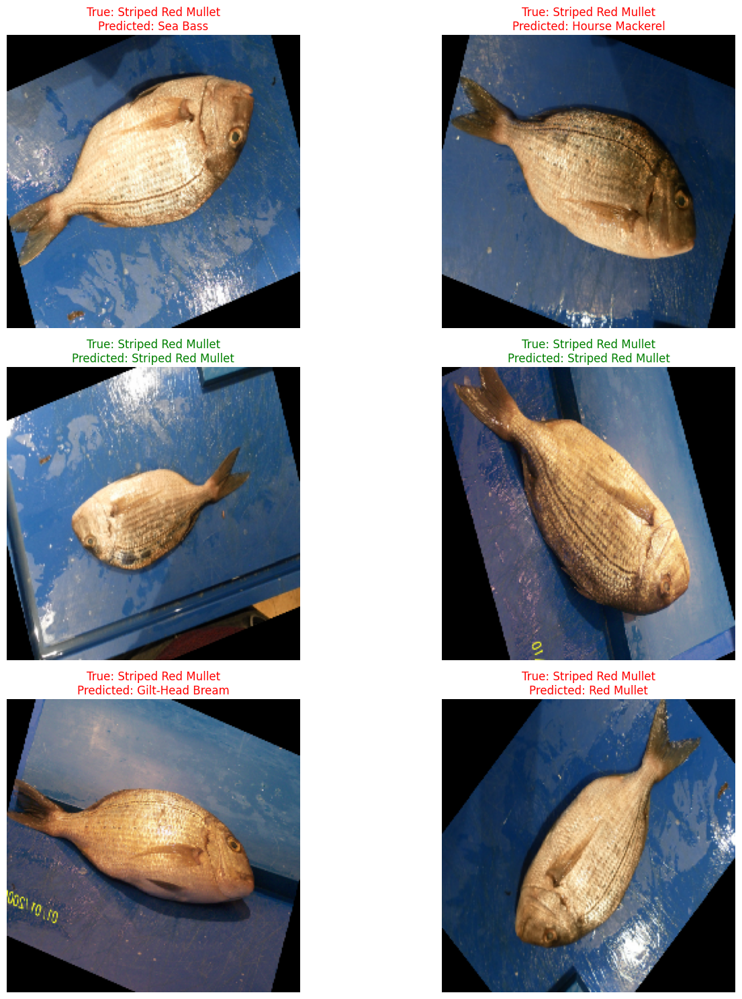

In [50]:
import random

def plot_predictions(test_generator, y_true, y_pred_classes, classes, num_images=5):
    # Randomly select num_images test images
    indices = random.sample(range(len(test_generator)), num_images)

    plt.figure(figsize=(15, 15))

    for i, idx in enumerate(indices):
        # Load and process the image
        img_path = test_generator.filepaths[idx]
        img = load_img(img_path, target_size=(224, 224))
        img_array = img_to_array(img) / 255.0

        # Get the true and predicted labels
        true_label = classes[y_true[idx]]
        predicted_label = classes[y_pred_classes[idx]]

        # Determine if the prediction is correct
        if true_label == predicted_label:
            color = 'green'
        else:
            color = 'red'

        # Visualization
        plt.subplot(num_images // 2, 2, i + 1)
        plt.imshow(img_array)
        plt.title(f'True: {true_label}\nPredicted: {predicted_label}', fontsize=12, color=color)
        plt.axis('off')

    plt.tight_layout()
    plt.show()

# Get predictions
y_pred = model.predict(test_generator)
y_pred_classes = np.argmax(y_pred, axis=1)
y_true = test_generator.classes

# Call the visualization function
plot_predictions(test_generator, y_true, y_pred_classes, classes, num_images=6)

**- Random Selection of Images:**
The random.sample function selects a random set of images from the test set to visualize. This ensures different samples are chosen each time you run the code.

**- Loading and Processing the Images:**
The function uses load_img and img_to_array to load the selected test images and convert them into arrays, scaling the pixel values to a range between 0 and 1 for display purposes.

**- True and Predicted Labels:**
y_true contains the actual labels of the test images, while y_pred_classes stores the model's predicted class labels. These are shown as the image title in the format True: ... and Predicted: ....

**- Visualization:**
The images are displayed in a subplot layout (e.g., 2x3), with each subplot showing the image, its actual label, and its predicted label. The layout can be adjusted based on the number of images to visualize (num_images).